In [1]:
# Scientific libraries
import numpy as np
import scipy

# import Pandas

import pandas as pd

# Graphic libraries

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot, download_plotlyjs
init_notebook_mode()
import plotly.graph_objs as go

# Extra options 

pd.options.display.max_rows = 10
pd.set_option('max_columns', 50)
sns.set(style='ticks', context='talk')

# Creating alias for magic commands
%alias_magic t time

Created `%t` as an alias for `%time`.
Created `%%t` as an alias for `%%time`.


In [30]:
df = pd.read_pickle('date_type_district.pkl')

In [31]:
df = df.sort_values('date')


In [97]:
ranges = pd.date_range(start=df.iloc[0].date, end=df.iloc[-1].date, freq='D')

In [69]:
newdf = pd.get_dummies(df,prefix=[''],columns=['primary_type'], drop_first=True)

In [70]:
newdf.columns = newdf.columns.str.strip().str.lower().str.replace('_', '').str.replace(' ', '_')

In [108]:
nndf = newdf[newdf.district==15]
nndf.pop('district')
True

True

In [109]:
nndf['date'] = nndf.date.dt.round('d')  
nndf = nndf.groupby('date').sum()
nndf = nndf.reset_index()

/Users/mikesova/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [110]:
# need to fill in missing dates
nndf = nndf.set_index('date').reindex(ranges)

In [112]:
nndf = nndf.fillna(0)

In [113]:
nndf

,assault,battery,burglary,concealed_carry_license_violation,crim_sexual_assault,criminal_damage,criminal_trespass,deceptive_practice,gambling,homicide,human_trafficking,interference_with_public_officer,intimidation,kidnapping,liquor_law_violation,motor_vehicle_theft,narcotics,non_-_criminal,non-criminal,non-criminal_(subject_specified),obscenity,offense_involving_children,other_narcotic_violation,other_offense,prostitution,public_indecency,public_peace_violation,robbery,sex_offense,stalking,theft,weapons_violation
2015-01-01,1,11,0,0,4,2,1,12,0,0,0,1,0,0,0,1,0,0,0,0,0,6,0,3,0,0,0,2,1,0,1,2
2015-01-02,1,6,1,0,0,0,0,3,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,1,0,0,0,1,0,0,3,0
2015-01-03,2,9,0,0,0,2,0,2,0,1,0,0,0,0,0,3,12,0,0,0,0,0,0,1,0,0,1,4,0,0,3,1
2015-01-04,1,9,1,0,1,2,1,1,0,0,0,2,0,0,0,0,7,0,0,0,0,0,0,2,0,0,0,0,0,0,2,0
2015-01-05,1,4,1,0,0,2,2,3,0,0,0,1,0,0,0,0,4,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-20,3,10,0,0,0,4,0,1,0,0,0,2,0,0,0,1,5,0,0,0,0,1,0,1,0,0,0,0,0,0,3,1
2019-03-21,1,7,0,0,1,2,2,1,0,0,0,0,0,0,0,1,3,0,0,0,0,1,0,2,0,0,0,0,0,0,8,0
2019-03-22,2,9,0,0,0,1,0,0,1,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,1,0,0,4,0
2019-03-23,2,4,1,0,0,0,1,3,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,2


In [129]:
def train_test_split(column, interval=28, ratio=0.8):
    d = None
    vals = []
    for i in range(len(ranges)-interval):
        X_start = ranges[i]
        X_end = ranges[i+interval]
        X = nndf.loc[X_start:X_end]
        vals.append(X.values.flatten())

    vals = np.array(vals)
    X = vals[:,:-1]
    y = vals[:,-1:]
    i = int(len(X)*ratio)
    Xtrain = X[:i]
    ytrain = y[:i].ravel()
    Xtest = X[i:]
    ytest = y[i:].ravel()
    return Xtrain,ytrain,Xtest,ytest


    

In [130]:
data = {}
for column in nndf.columns:
    data[column] = train_test_split(nndf[column])


In [143]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error

In [150]:
models = {}
for k,v in data.items():
    Xtrain,ytrain,Xtest,ytest = v
    
    r = RandomForestClassifier(n_estimators=20)
    r.fit(Xtrain,ytrain)
    
    print(k)
    ypred = r.predict(Xtest)
    err = mean_squared_error(ytest,ypred)
    print('mean squared error', err)
    models[k] = {'model':r,'ypred':ypred,'ytest':ytest}
    

assault
mean squared error 1.0592105263157894
battery
mean squared error 1.0592105263157894
burglary
mean squared error 1.0657894736842106
concealed_carry_license_violation
mean squared error 1.111842105263158
crim_sexual_assault
mean squared error 1.042763157894737
criminal_damage
mean squared error 1.0230263157894737
criminal_trespass
mean squared error 1.1151315789473684
deceptive_practice
mean squared error 0.9407894736842105
gambling
mean squared error 0.9901315789473685
homicide
mean squared error 1.0460526315789473
human_trafficking
mean squared error 1.0723684210526316
interference_with_public_officer
mean squared error 1.125
intimidation
mean squared error 1.0592105263157894
kidnapping
mean squared error 1.0625
liquor_law_violation
mean squared error 1.049342105263158
motor_vehicle_theft
mean squared error 1.1019736842105263
narcotics
mean squared error 0.9967105263157895
non_-_criminal
mean squared error 1.0263157894736843
non-criminal
mean squared error 1.1019736842105263
no

In [151]:
a = models['assault']
p, t = a['ypred'],a['ytest']


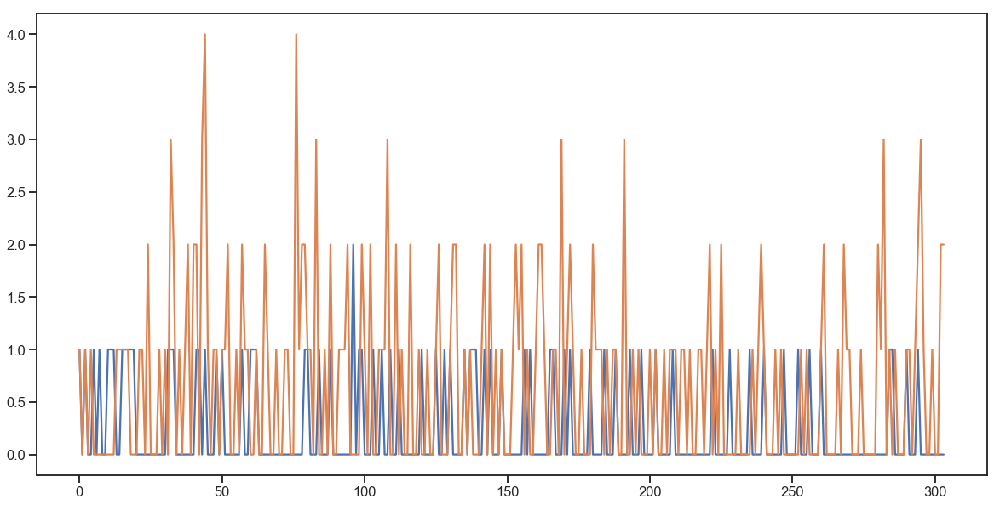

In [152]:
plt.figure(figsize=(20,10))
plt.plot(p)
plt.plot(t)


In [153]:
def get_rolling(x,N):
    return pd.Series(x).rolling(window=N).mean().iloc[N-1:].values

In [159]:
proll = get_rolling(p,7)
troll = get_rolling(t,7)

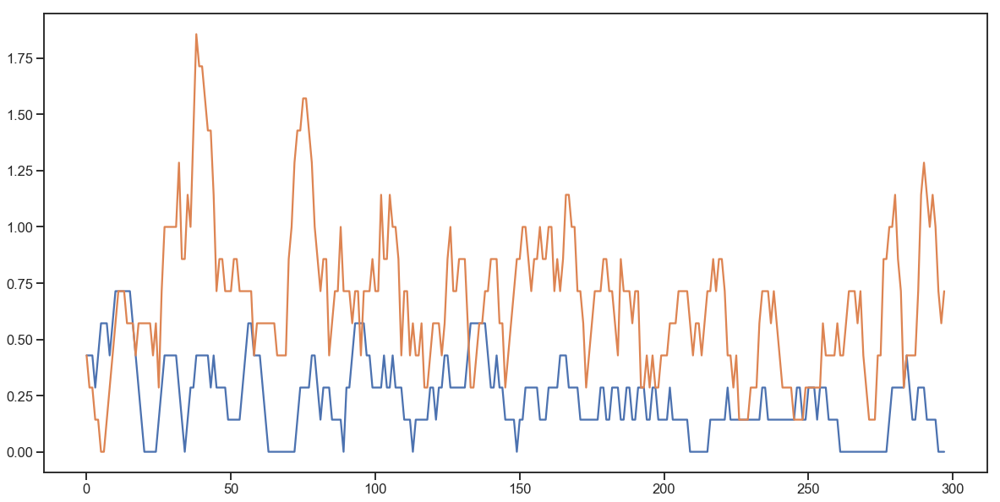

In [160]:
proll = get_rolling(p,7)
troll = get_rolling(t,7)
plt.figure(figsize=(20,10))
plt.plot(proll)
plt.plot(troll)

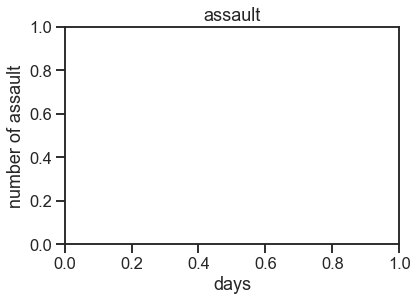

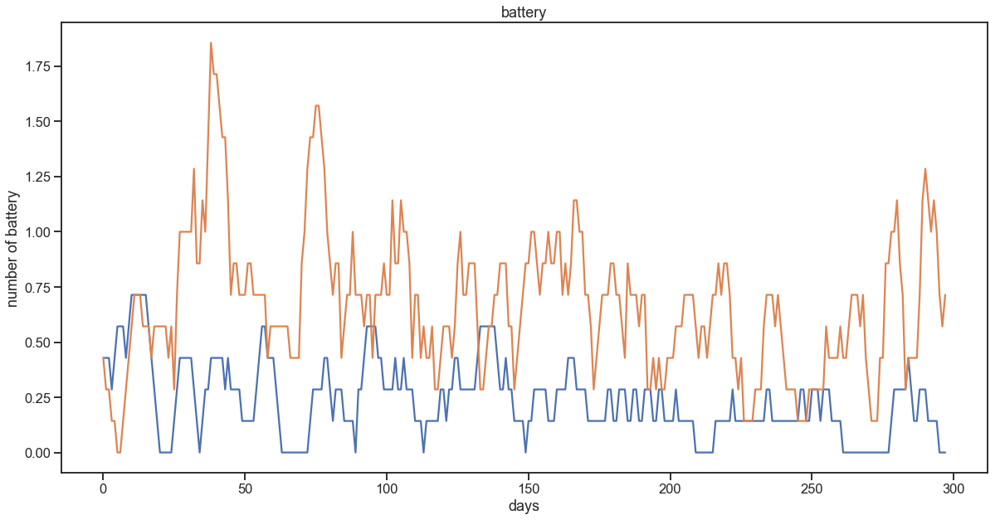

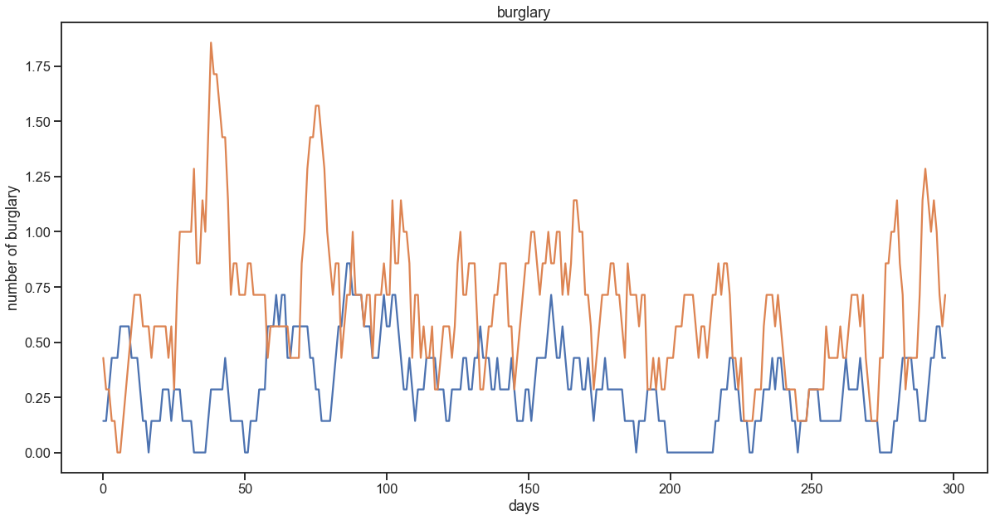

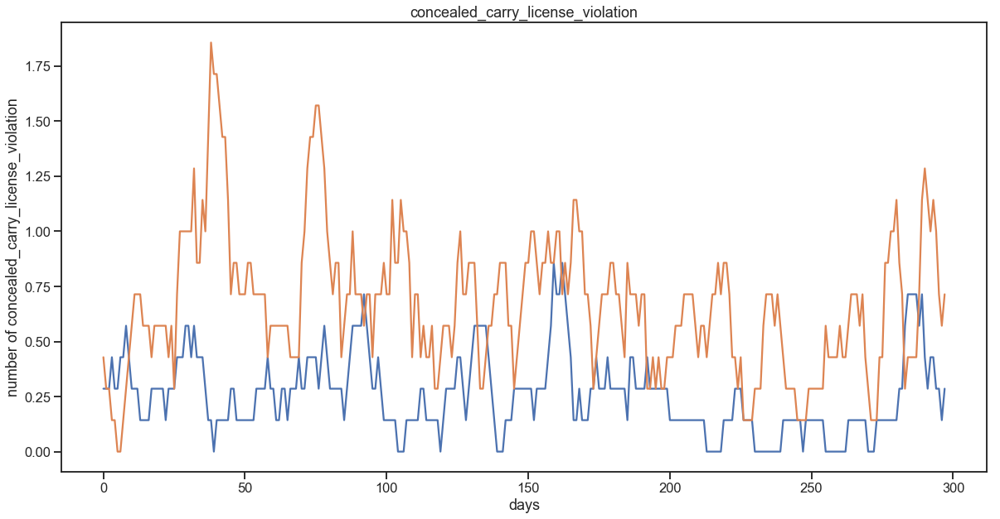

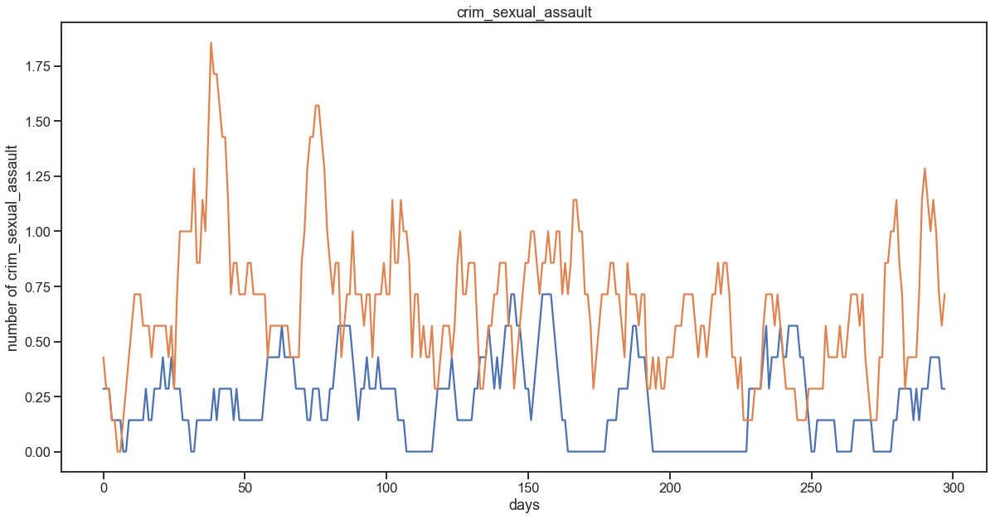

...

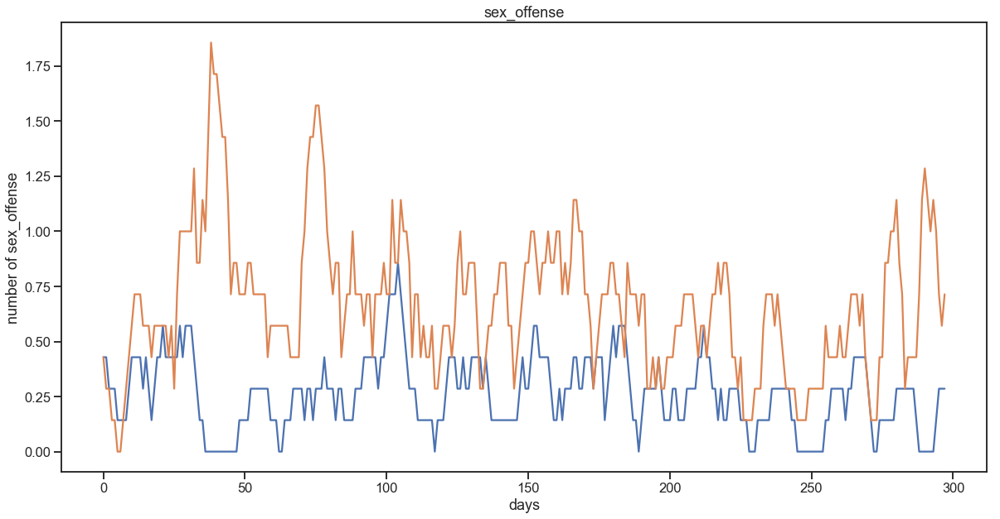

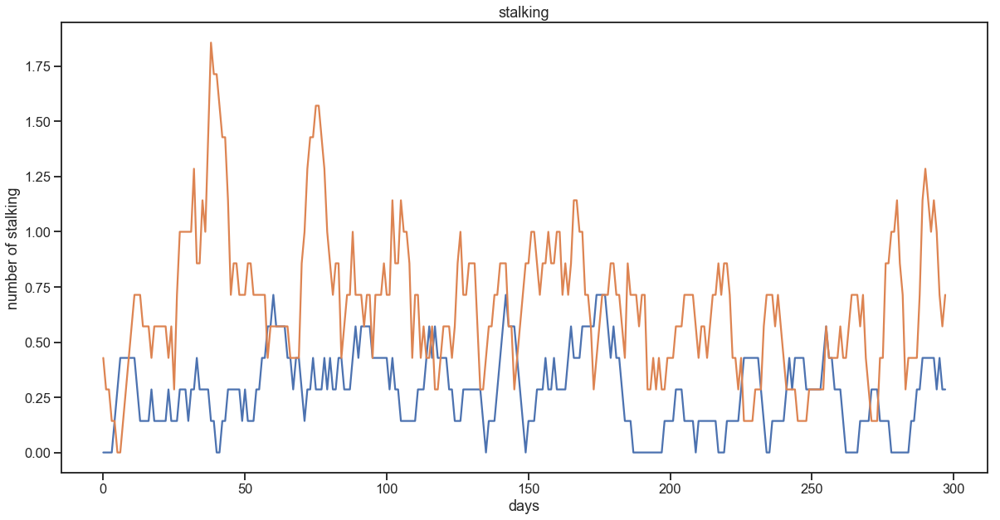

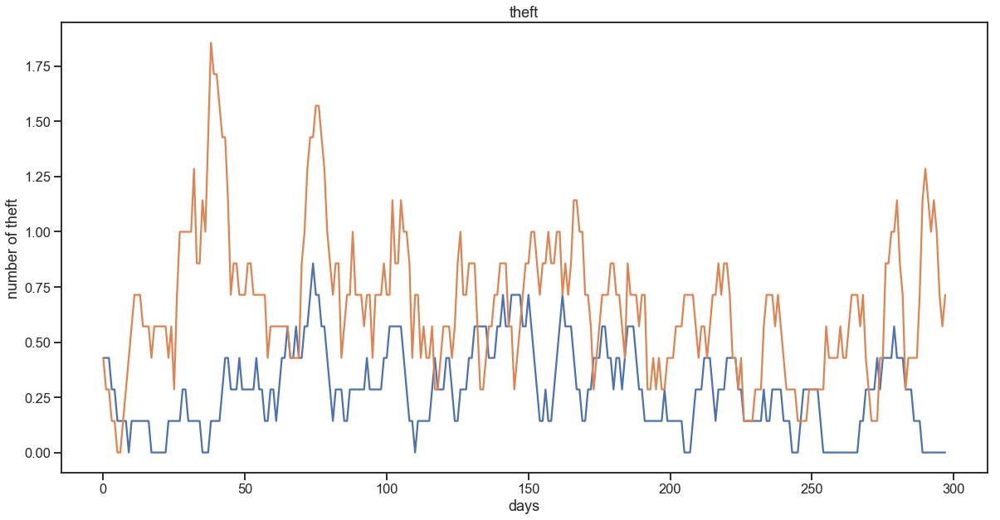

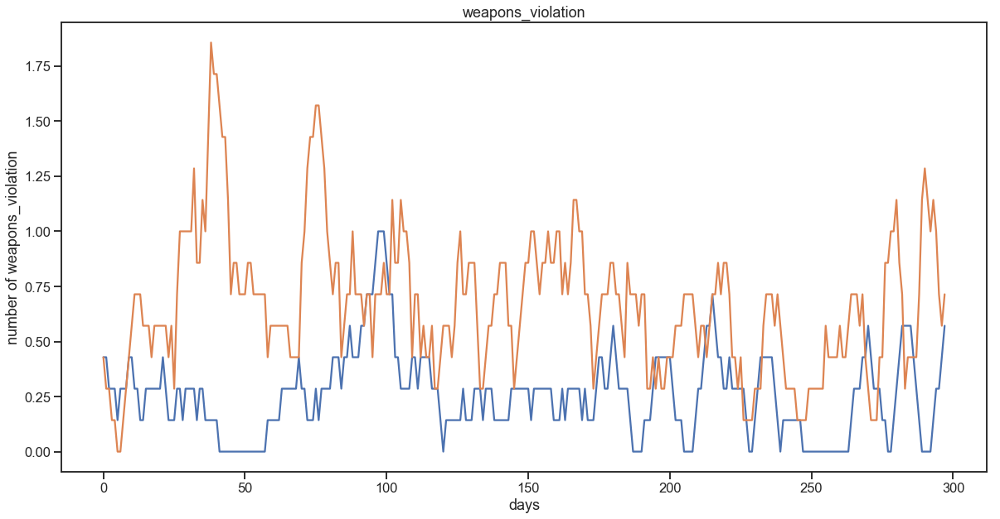

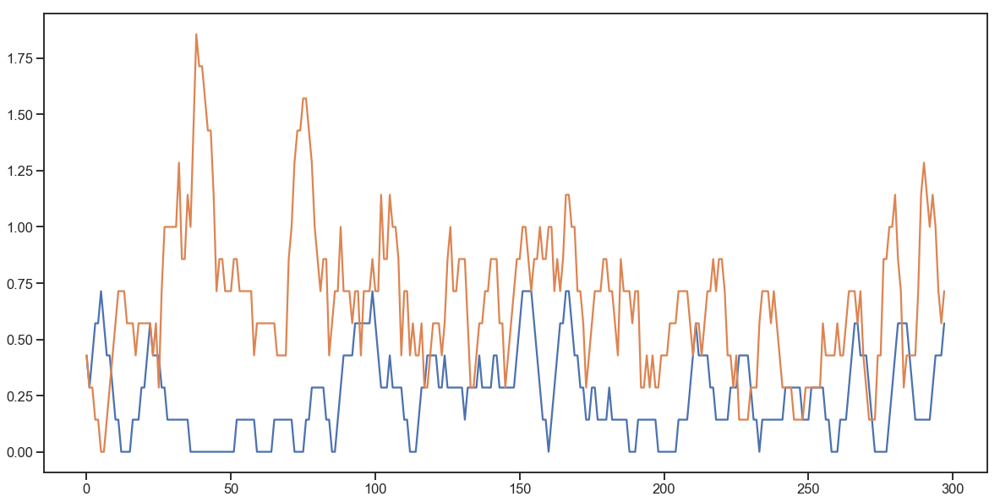

In [163]:
for k,v in models.items():
    p, t = v['ypred'],v['ytest']
    proll = get_rolling(p,7)
    troll = get_rolling(t,7)
    plt.title(k)
    plt.xlabel('days')
    plt.ylabel('number of ' + k)
    plt.figure(figsize=(20,10))
    plt.plot(proll)
    plt.plot(troll)